## Image Augmentation by Generative adversarial network 

In [ ]:
pwd

'/content'

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
cd /content/drive/MyDrive/Colab Notebooks/

/content/drive/MyDrive/Colab Notebooks


## Import all Libraries

In [3]:
 import numpy as np
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import Dense, Conv2D, Flatten, Reshape, Conv2DTranspose
from keras.layers import LeakyReLU, Dropout
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model
from keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model
from os import listdir
import cv2
import numpy as np

from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout

from matplotlib import pyplot as plt

In [6]:
from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout

from matplotlib import pyplot as plt

In [7]:
def load_images(directory,n):
  images=[]
  i=0
  for file in listdir(directory):
    filename = directory + file
    image = cv2.imread(filename)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = np.asarray(image)
    images.append(image)
    i +=1
    if i >= n:
      break
  return np.asarray(images)

In [10]:
images=load_images('/content/drive/MyDrive/Colab Notebooks/train/train/',25)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  del sys.path[0]


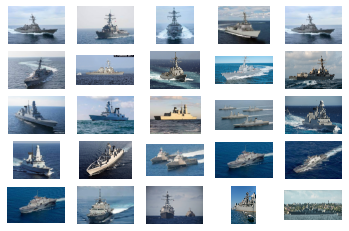

In [11]:
for i in range(25):
  plt.subplot(5,5,1+i)
  plt.axis('off')
  plt.imshow(images[i])
plt.show()

In [12]:
# define the discriminator model
def define_D(in_shape=(128,128,3)):
    model = Sequential()
    model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model
model_D = define_D()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [13]:
# define the generator model
def define_G(latent_dim):
    model = Sequential()
	  # foundation for 16x16 image
    n_nodes = 256 * 16 * 16
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((16, 16, 256)))
    # upsample to 32x32
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 64x64
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsamplde to 128x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(3, (7,7), activation='tanh', padding='same'))
    return model
model_G = define_G(100)

In [14]:
# define the combined generator and discriminator model, for updating the generator
def define_GAN(model_G, model_D):
	# make weights in the discriminator not trainable
	model_D.trainable = False
	model = Sequential()
	model.add(model_G)
	model.add(model_D)
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model

In [15]:
def load_real_images():
    datagen = ImageDataGenerator(rescale=1./255)
    X = datagen.flow_from_directory('/content/drive/MyDrive/Colab Notebooks/train',
                                    target_size= (128,128),
                                    batch_size=12500,
                                    class_mode='binary')
    data_list = []
    batch_index = 0
    while batch_index <= X.batch_index:
        data = X.next()
        data_list.append(data[0])
        batch_index += 1
    img_array = np.asarray(data_list)
    return img_array

In [16]:
def generate_real_images(dataset, n_samples):
    i = np.random.randint(0, dataset.shape[0], n_samples)
    X = dataset[i]
    y = np.ones((n_samples,1))
    return X, y

In [17]:
def generate_latent_points(latent_dim, n_samples):
    X = np.random.randn(latent_dim * n_samples)
    X = X.reshape(n_samples, latent_dim)
    return X

In [18]:
def generate_fake_images(model_G, latent_dim, n_samples):
    X_input = generate_latent_points(latent_dim, n_samples)
    X = model_G.predict(X_input)
    y = np.zeros((n_samples, 1))
    return X, y

In [19]:
def summarize_performance(epoch, model_G, model_D, dataset, latent_dim, n_samples=100):
  model_G.save('/content/drive/My Drive/Colab Notebooks/model_dog_' +str(epoch)+ '.h5')
  X_real, y_real = generate_real_images(dataset, n_samples)
  _, acc_real = model_D.evaluate(X_real, y_real, verbose=0)
  x_fake, y_fake = generate_fake_images(model_G, latent_dim, n_samples)
  _, acc_fake = model_D.evaluate(x_fake, y_fake, verbose=0)
  print('Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))

In [20]:
def train_discriminator(model, dataset, n_iter=100, n_batch=256):
    half_batch = int(n_batch/2)
    # manually enumerate epochs
    for i in range(n_iter):
        X_real, y_real = generate_real_images(dataset, half_batch)
        _, real_acc = model.train_on_batch(X_real, y_real)
        X_fake, y_fake = generate_fake_images(half_batch)
        _, fake_acc = model.train_on_batch(X_fake, y_fake)
        print('%d real=%.0f%% fake=%.0f%%' % (i+1, real_acc*100, fake_acc*100))

In [21]:
def train_GAN(model_G, model_D, model_GAN, dataset, latent_dim, n_epochs=100, n_batch=128):
	bat_per_epo = int(dataset.shape[0] / n_batch)
	half_batch = int(n_batch / 2)
	# manually enumerate epochs
	for i in range(n_epochs):
		# enumerate batches over the training set
		for j in range(bat_per_epo):
			X_real, y_real = generate_real_images(dataset, half_batch)
			X_fake, y_fake = generate_fake_images(model_G, latent_dim, half_batch)
			X, y = np.vstack((X_real, X_fake)), np.vstack((y_real, y_fake))
			d_loss, _ = model_D.train_on_batch(X, y)
			X_gan = generate_latent_points(latent_dim, n_batch)
			y_gan = np.ones((n_batch, 1))
			g_loss = model_GAN.train_on_batch(X_gan, y_gan)
			print('%d, %d/%d, d=%.3f, g=%.3f' % (i+1, j+1, bat_per_epo, d_loss, g_loss))
		# evaluate the model performance
		if (i+1) % 10 == 0:
			summarize_performance(i, model_G, model_D, dataset, latent_dim)

In [22]:
latent_dim =100
model_D = define_D()
model_G = define_G(latent_dim)
model_GAN = define_GAN(model_G, model_D)
dataset=load_real_images()
train_GAN(model_G, model_D,model_GAN,dataset[0], latent_dim)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Found 27 images belonging to 1 classes.
Accuracy real: 30%, fake: 68%
Accuracy real: 23%, fake: 62%
Accuracy real: 25%, fake: 60%
Accuracy real: 20%, fake: 69%
Accuracy real: 25%, fake: 50%
Accuracy real: 15%, fake: 66%
Accuracy real: 21%, fake: 63%
Accuracy real: 25%, fake: 58%
Accuracy real: 26%, fake: 56%
Accuracy real: 26%, fake: 72%


In [23]:
model = load_model('/content/drive/MyDrive/Colab Notebooks/cifar_generator.h5')


In [24]:
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = np.random.randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	z_input = x_input.reshape(n_samples, latent_dim)
	return z_input

In [25]:
def plot_images(images, n):
	# scales image values in the range of [0,1]
	images = (images-images.min())/(images.max() - images.min())
	for i in range(n):
		# define subplot
		plt.subplot(1, n, 1 + i)
		# turn off axis
		plt.axis('off')
		# plot raw pixel data
		plt.imshow(images[i, :, :])
	plt.show()

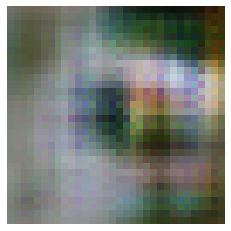

In [28]:
pts = generate_latent_points(100, 100)
# generate images
X = model.predict(pts)
# plot the result
plot_images(X, 1)

# Ship Object Detection Using YOLOv5 with cspnet

### Backbone:
 
 Model Backbone is mostly used to extract key features from an input image. CSP(Cross Stage Partial Networks) are used as a backbone in YOLO v5 to extract rich in useful characteristics from an input image.

 Cloning the GitHub repository of Yolo v5.

 Preparation & Pre-Processing of Dataset.

 Training the model.

 Prediction & Live Testing.

In [ ]:
pwd

'/content/drive/My Drive/Projects/yolov5'

In [ ]:
%cd /content/drive/MyDrive/Projects/

/content/drive/MyDrive/Projects


In [ ]:
#!unzip -q /content/drive/MyDrive/Colab Notebooks/ship.zip

!unzip -q /content/drive/MyDrive/Projects/ship.zip

In [ ]:
pwd

'/content/drive/MyDrive/Projects'

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 13320, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 13320 (delta 30), reused 38 (delta 29), pack-reused 13277
Receiving objects: 100% (13320/13320), 12.06 MiB | 6.83 MiB/s, done.
Resolving deltas: 100% (9277/9277), done.


In [ ]:
%cd yolov5/

/content/drive/MyDrive/Projects/yolov5


In [ ]:
!pip install -r requirements.txt

     |████████████████████████████████| 596 kB 7.6 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
pwd

'/content/drive/MyDrive/Projects/yolov5'

In [ ]:
!python train.py --img 200 --batch 8 --epochs 50 --data coco128.yaml --weights yolov5s.pt --nosave --cache

train: weights=yolov5s.pt, cfg=, data=coco128.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=8, imgsz=200, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds
YOLOv5 🚀 v6.1-178-g4870064 torch 1.11.0+cu113 CPU

remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 4 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (4/4), done.
hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_d

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!python val.py --weights /content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt --data coco128.yaml --img 200

val: data=/content/drive/MyDrive/Projects/yolov5/data/coco128.yaml, weights=['/content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt'], batch_size=32, imgsz=200, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-178-g4870064 torch 1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7031701 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning '/content/drive/MyDrive/Projects/test/labels.cache' images and labels... 194 found, 0 missing, 0 empty, 0 corrupt: 100% 194/194 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 7/7 [00:14<00:00,  2.08s/it]
                 all        194        211      0.743      0.744      0.777      0.564
                boat        194         85      0.851       0.67    

In [ ]:
!python detect.py --source /content/drive/MyDrive/Projects/test/images --weights /content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt --img 200 --save-txt --save-conf


detect: weights=['/content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt'], source=/content/drive/MyDrive/Projects/test/images, data=data/coco128.yaml, imgsz=[200, 200], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-178-g4870064 torch 1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7031701 parameters, 0 gradients, 15.9 GFLOPs
image 1/194 /content/drive/MyDrive/Projects/test/images/1.jpg: 160x224 1 Destroyer, Done. (0.056s)
image 2/194 /content/drive/MyDrive/Projects/test/images/100396.jpg: 224x224 1 Cruise, Done. (0.131s)
image 3/194 /content/drive/MyDrive/Projects/test/images/101117.jpg: 224x224 2 boats, 2 Cargos, 1 Factoryship, Done. (0.056s)
image 4/194 

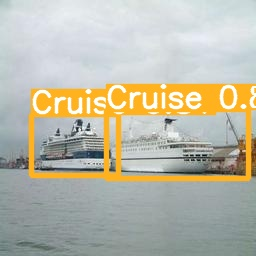

In [ ]:
from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp2/6962.jpg')

cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

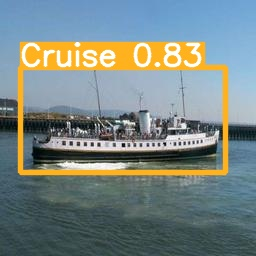

In [ ]:
from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp2/100396.jpg')

cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

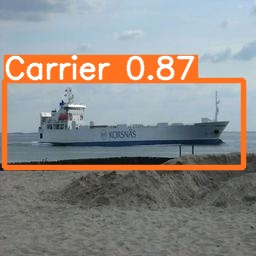

In [ ]:


from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp2/12845.jpg')

cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

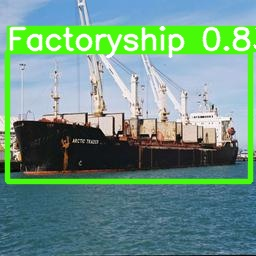

In [ ]:


from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp2/24267.jpg')

cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

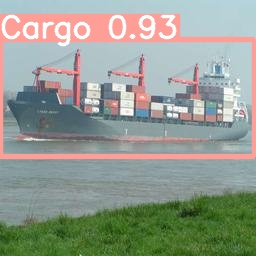

In [ ]:


from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp2/52727.jpg')

cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

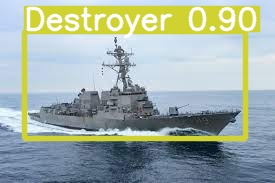

In [ ]:


from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp2/1.jpg')

cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

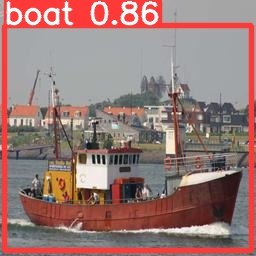

In [ ]:


from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp2/78756.jpg')

cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

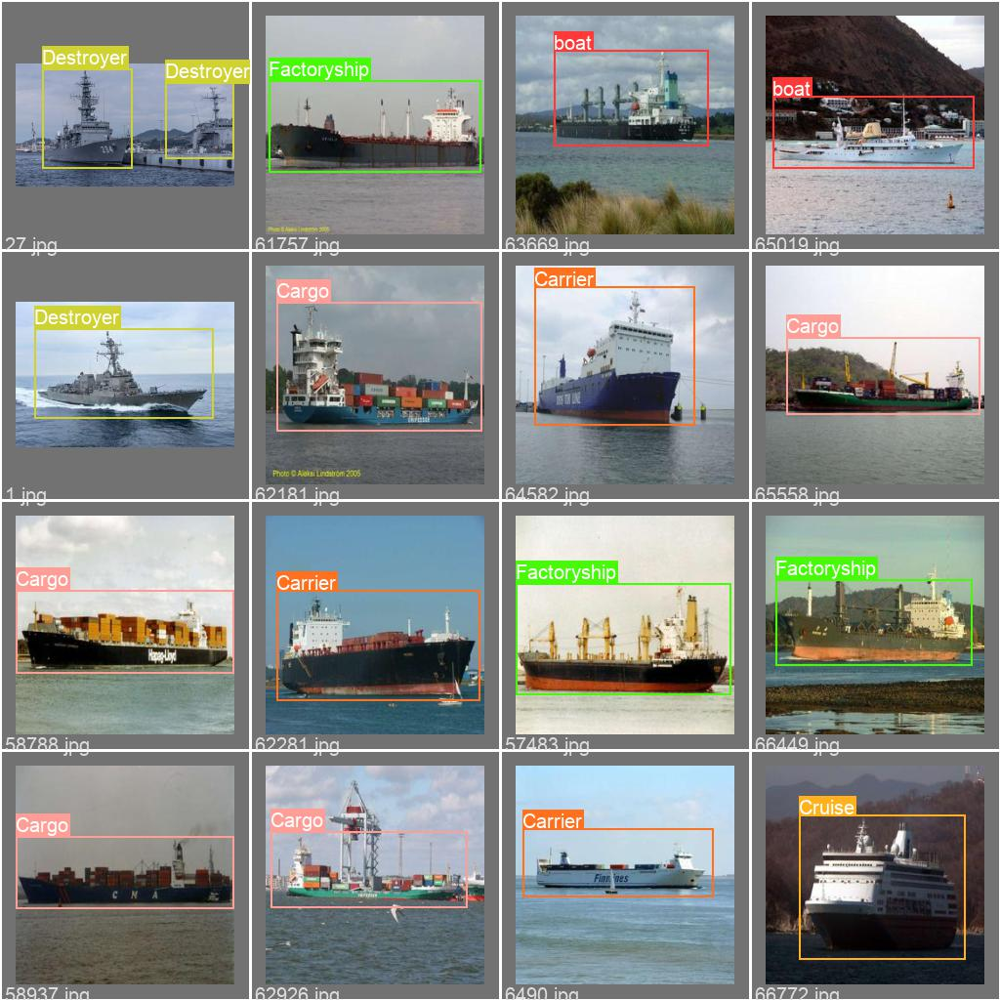

In [ ]:


from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/val/exp2/val_batch0_labels.jpg')
cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

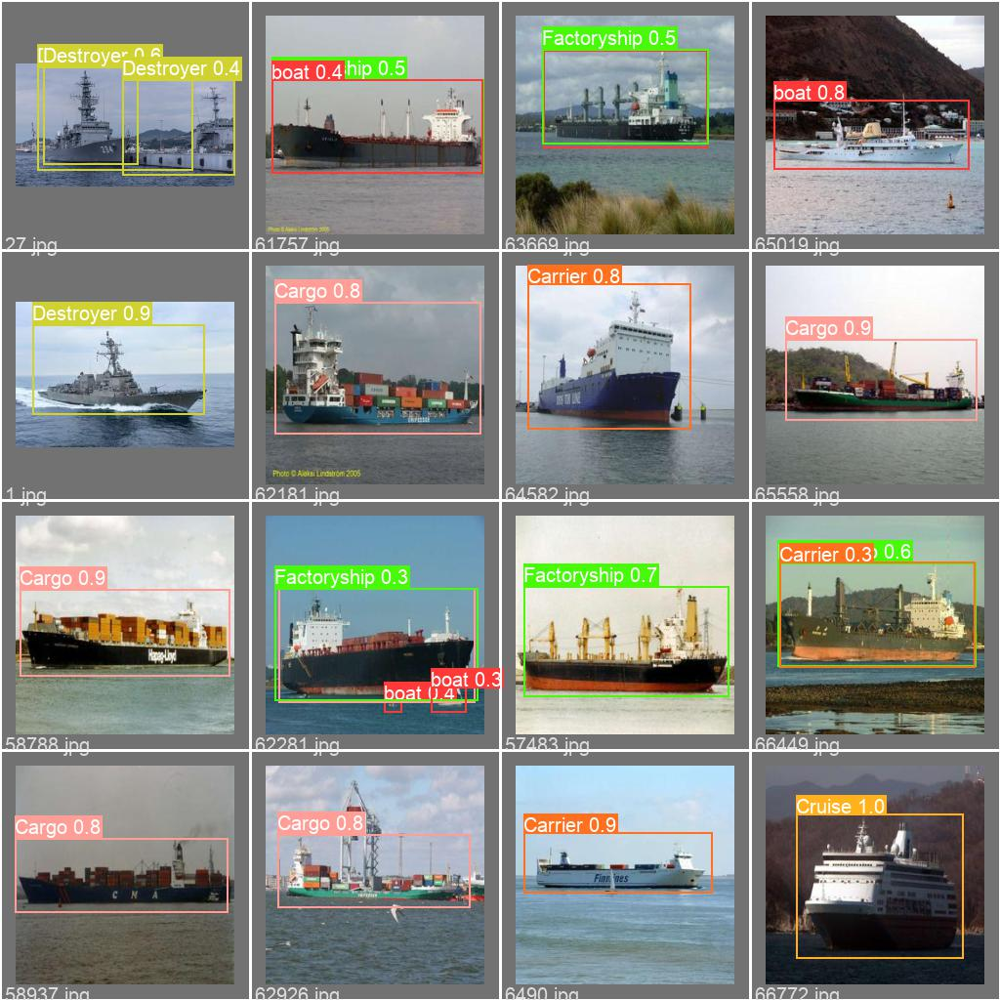

In [ ]:


from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/val/exp2/val_batch0_pred.jpg')
cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

In [ ]:
!python detect.py --source /content/drive/MyDrive/Projects/Allship.png --weights /content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt --img 200 --save-txt --save-conf


#!python detect.py --source /content/drive/MyDrive/Projects/test/images --weights /content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt --img 200 --save-txt --save-conf

detect: weights=['/content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt'], source=/content/drive/MyDrive/Projects/Allship.png, data=data/coco128.yaml, imgsz=[200, 200], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-178-g4870064 torch 1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7031701 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /content/drive/MyDrive/Projects/Allship.png: 96x224 2 boats, 1 Cargo, 1 Cruise, 1 Destroyer, Done. (0.036s)
Speed: 0.3ms pre-process, 35.6ms inference, 0.9ms NMS per image at shape (1, 3, 224, 224)
Results saved to runs/detect/exp3
1 labels saved to runs/detect/exp3/labels


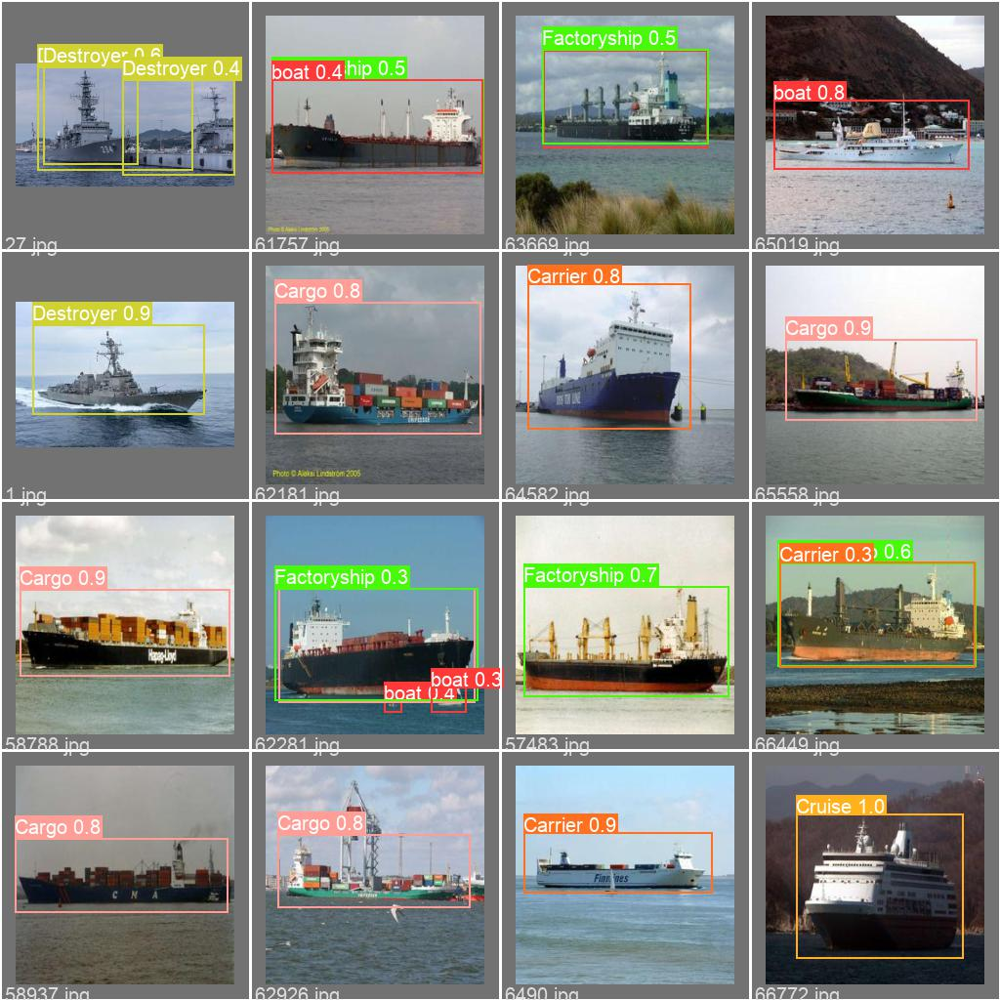

In [ ]:

from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/val/exp2/val_batch0_pred.jpg')
cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()

In [ ]:
!python detect.py --source /content/drive/MyDrive/Projects/Allship1.png --weights /content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt --img 200 --save-txt --save-conf


#!python detect.py --source /content/drive/MyDrive/Projects/test/images --weights /content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt --img 200 --save-txt --save-conf

detect: weights=['/content/drive/MyDrive/Projects/yolov5/runs/train/exp/weights/last.pt'], source=/content/drive/MyDrive/Projects/Allship1.png, data=data/coco128.yaml, imgsz=[200, 200], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-178-g4870064 torch 1.11.0+cu113 CPU

Fusing layers... 
Model summary: 213 layers, 7031701 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /content/drive/MyDrive/Projects/Allship1.png: 160x224 2 boats, 1 Cargo, 2 Destroyers, 1 Factoryship, Done. (0.048s)
Speed: 0.3ms pre-process, 48.3ms inference, 3.9ms NMS per image at shape (1, 3, 224, 224)
Results saved to runs/detect/exp4
1 labels saved to runs/detect/exp4/labels


## Create one custom image file and checking the model

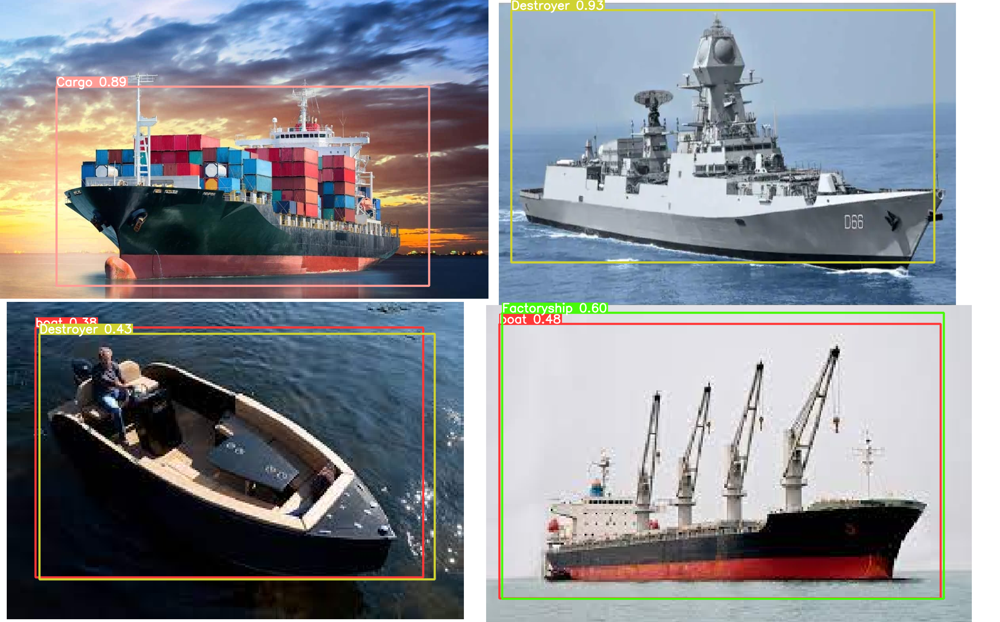

In [ ]:

from google.colab.patches import cv2_imshow

image = cv2.imread(r'/content/drive/MyDrive/Projects/yolov5/runs/detect/exp4/Allship1.png')
cv2_imshow( image)

cv2.waitKey(0)

cv2.destroyAllWindows()